# Land Use and Land Cover Classification using Euro SAT dataset
https://arxiv.org/pdf/1709.00029.pdf

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai.vision import *
from fastai.metrics import error_rate

In [5]:
path=download_data("http://madm.dfki.de/files/sentinel/EuroSAT.zip",ext='')

In [6]:
path=Path('/home/jupyter/.fastai/data/2750')

In [7]:
path.ls()

[PosixPath('/home/jupyter/.fastai/data/2750/Pasture'),
 PosixPath('/home/jupyter/.fastai/data/2750/Highway'),
 PosixPath('/home/jupyter/.fastai/data/2750/models'),
 PosixPath('/home/jupyter/.fastai/data/2750/SeaLake'),
 PosixPath('/home/jupyter/.fastai/data/2750/HerbaceousVegetation'),
 PosixPath('/home/jupyter/.fastai/data/2750/Forest'),
 PosixPath('/home/jupyter/.fastai/data/2750/River'),
 PosixPath('/home/jupyter/.fastai/data/2750/Industrial'),
 PosixPath('/home/jupyter/.fastai/data/2750/Residential'),
 PosixPath('/home/jupyter/.fastai/data/2750/export.pkl'),
 PosixPath('/home/jupyter/.fastai/data/2750/PermanentCrop'),
 PosixPath('/home/jupyter/.fastai/data/2750/AnnualCrop')]

In [8]:
tfms=get_transforms()
data = (ImageList.from_folder(path)
           .split_by_rand_pct(0.2)
           .label_from_folder()
           .transform(tfms,size=224)
           .add_test_folder()     
           .databunch())

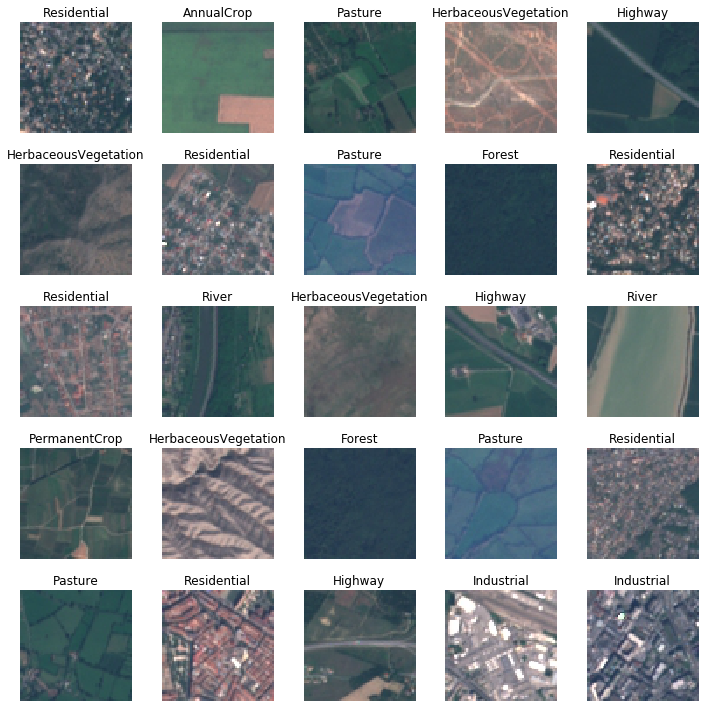

In [28]:
data.show_batch(row=3,figsize=(10,10))

In [9]:
learner=cnn_learner(data,models.resnet50,metrics=error_rate)

In [6]:
learner.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.387575,0.226258,0.076667,03:40
1,0.202293,0.102382,0.033519,03:34
2,0.161636,0.077814,0.024815,03:35
3,0.113627,0.071675,0.022778,03:35


In [10]:
#wow this almost 98% accuracy 
learner.save("stage-1",return_path=True)
#doc(learner.save)

PosixPath('/home/jupyter/.fastai/data/2750/models/stage-1.pth')

In [11]:
interp = ClassificationInterpretation.from_learner(learner)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

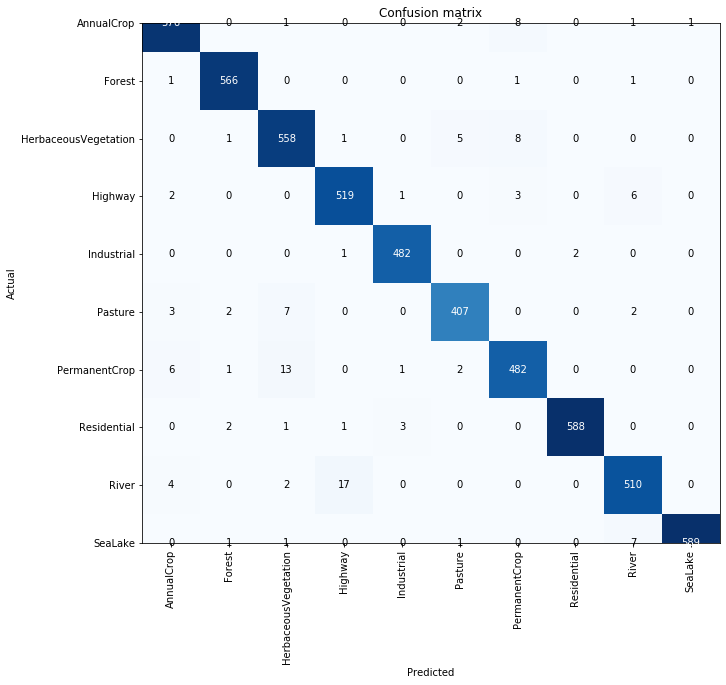

In [16]:
interp.plot_confusion_matrix(figsize=(10,15))

In [18]:
interp.most_confused(min_val=5)

[('River', 'Highway', 17),
 ('PermanentCrop', 'HerbaceousVegetation', 13),
 ('AnnualCrop', 'PermanentCrop', 8),
 ('HerbaceousVegetation', 'PermanentCrop', 8),
 ('Pasture', 'HerbaceousVegetation', 7),
 ('SeaLake', 'River', 7),
 ('Highway', 'River', 6),
 ('PermanentCrop', 'AnnualCrop', 6),
 ('HerbaceousVegetation', 'Pasture', 5)]

In [19]:
learner.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


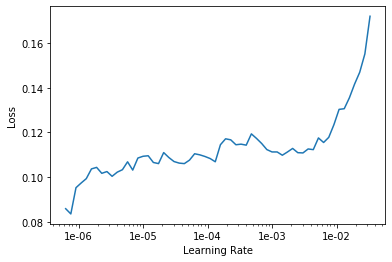

In [20]:
learner.recorder.plot()

In [22]:
#This doesn't show any clear part or decreasing loss. We may be overfitting 
learner.unfreeze()

In [23]:
learner.fit_one_cycle(4,max_lr=slice(3e-04,3e-03))

epoch,train_loss,valid_loss,error_rate,time
0,0.298916,0.241310,0.075926,04:45
1,0.215320,0.374192,0.115185,04:40
2,0.113221,0.077098,0.023519,04:39
3,0.068513,0.047290,0.015185,04:40


In [ ]:
#After unfreeze there is almost 98.5% accurancy , need to check whether it is overfitting

In [24]:
learner.save('euro-sat-unfreeze')
learner.export("euro-sat-unfreeze.pkl")

In [51]:
defaults.device = torch.device('cpu')

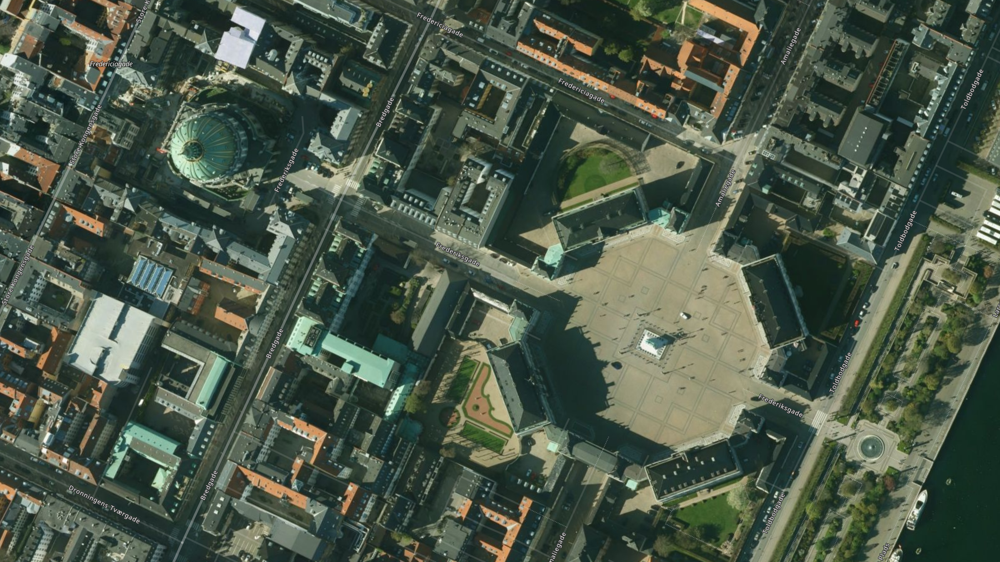

In [13]:
img = open_image('city.png')
img

In [12]:
learn = learner.load("stage-1")
learn.export('euro-sat-stage1-98-accur.pkl')

In [14]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class,outputs

(Category Residential,
 tensor([4.3243e-02, 2.2414e-04, 5.4033e-03, 1.1617e-02, 9.5973e-02, 3.3501e-04,
         1.1139e-01, 5.9687e-01, 1.2250e-01, 1.2447e-02]))

In [ ]:
# We have saved the pkl file now try to load the pkl file and predict with it

In [17]:
#doc(load_learner)
loaded_learner=load_learner(path,'euro-sat-stage1-98-accur.pkl')

In [27]:
pred_class,pred_idx,outputs = loaded_learner.predict(img)
pred_class,outputs

(Category Residential,
 tensor([4.3243e-02, 2.2414e-04, 5.4033e-03, 1.1617e-02, 9.5973e-02, 3.3501e-04,
         1.1139e-01, 5.9687e-01, 1.2250e-01, 1.2447e-02]))

In [26]:
unfreezed_learner=load_learner(path,'euro-sat-unfreeze.pkl')
pred_class,pred_idx,outputs = unfreezed_learner.predict(img)
pred_class,outputs
#Why the unfreeze model cannot identify this when the stage1 model does . But may be one instance is not enough
# conclusion 

(Category Industrial,
 tensor([7.5042e-05, 1.4885e-04, 2.0340e-03, 1.5541e-05, 9.9039e-01, 8.0136e-05,
         3.0677e-03, 8.0263e-04, 2.8496e-03, 5.3774e-04]))